# Dog Breed Prediction Using Transfer Learning
### Dataset: kaggle - Stanford Dogs Dataset - Over 20.000images and 120 dog breeds

# 1. Import thư viện và dữ liệu

In [2]:
import gc
gc.collect()
import numpy as np
import pandas as pd

import os
from itertools import chain
import random

import matplotlib.pyplot as plt
#jupyter notebook
%matplotlib inline
from  matplotlib.image import imread

Tải dữ liệu từ Kaggle 

In [3]:
# from kaggle.api.kaggle_api_extended import KaggleApi

# api = KaggleApi()
# api.authenticate()

# dataset_path = "jessicali9530/stanford-dogs-dataset"
# f = "D:\\DATASET\\DogBreeds"
# api.dataset_download_files(dataset_path, path=f, unzip=True)
# os.listdir(f)

Đọc dữ liệu đã tải

In [4]:
f = "D:\\DATASET\\DogBreeds\\archive\\images\\Images"
print(os.listdir(f))
dog_classes = os.listdir(f)

['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yorkshire_t

# 2. Phân tích và xử lý dữ liệu đầu vào

Lấy ra các giống chó

In [5]:
breeds = [breed.split('-',1)[1] for breed in dog_classes]
breeds[:10]

['Chihuahua',
 'Japanese_spaniel',
 'Maltese_dog',
 'Pekinese',
 'Shih-Tzu',
 'Blenheim_spaniel',
 'papillon',
 'toy_terrier',
 'Rhodesian_ridgeback',
 'Afghan_hound']

In [6]:
X = []
Y = []
fullPaths = ["D:\\DATASET\\DogBreeds\\archive\\images\\Images\\{}".format(dog_class) for dog_class in dog_classes]
for counter, fullPath in enumerate(fullPaths):
    for img in os.listdir(fullPath):
        X.append([fullPath + '\\' + img])
        #1 counter la 1 label từ breeds tuong ung voi path, sau đó thêm labels vào Y
        Y.append(breeds[counter])
#X chứa images, Y chứa labels
print(X[:10])
print(Y[:10])

[['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10074.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10131.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10621.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_1073.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10976.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11140.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11238.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11258.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11337.jpg'], ['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11477.jpg']]
['Chihuahua', 'Chihuahua', 'Chihuahua', 'Chihuahua

Tách các danh sách ra và nối thành 1 danh sách duy nhất

In [7]:
X = list(chain.from_iterable(X))
print(X[:10])
print("Number of images: ", len(X))

['D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10074.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10131.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10621.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_1073.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10976.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11140.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11238.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11258.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11337.jpg', 'D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11477.jpg']
Number of images:  20580


Trộn (x, y) và sắp xếp hình ảnh - Trộn các hình ảnh và nhãn để chúng không được nhóm theo giống của chúng.

In [8]:
mixed = list(zip(X,Y)) #add tuples
print(mixed[:10])
random.shuffle(mixed)
print(mixed[:10])
X[:], Y[:] = zip(*mixed) #Giai nen -> 2 lists X va Y

[('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10074.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10131.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10621.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_1073.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_10976.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11140.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11238.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11258.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\archive\\images\\Images\\n02085620-Chihuahua\\n02085620_11337.jpg', 'Chihuahua'), ('D:\\DATASET\\DogBreeds\\ar

Lấy ngẫu nhiên 9 ảnh chó theo nhãn của chúng

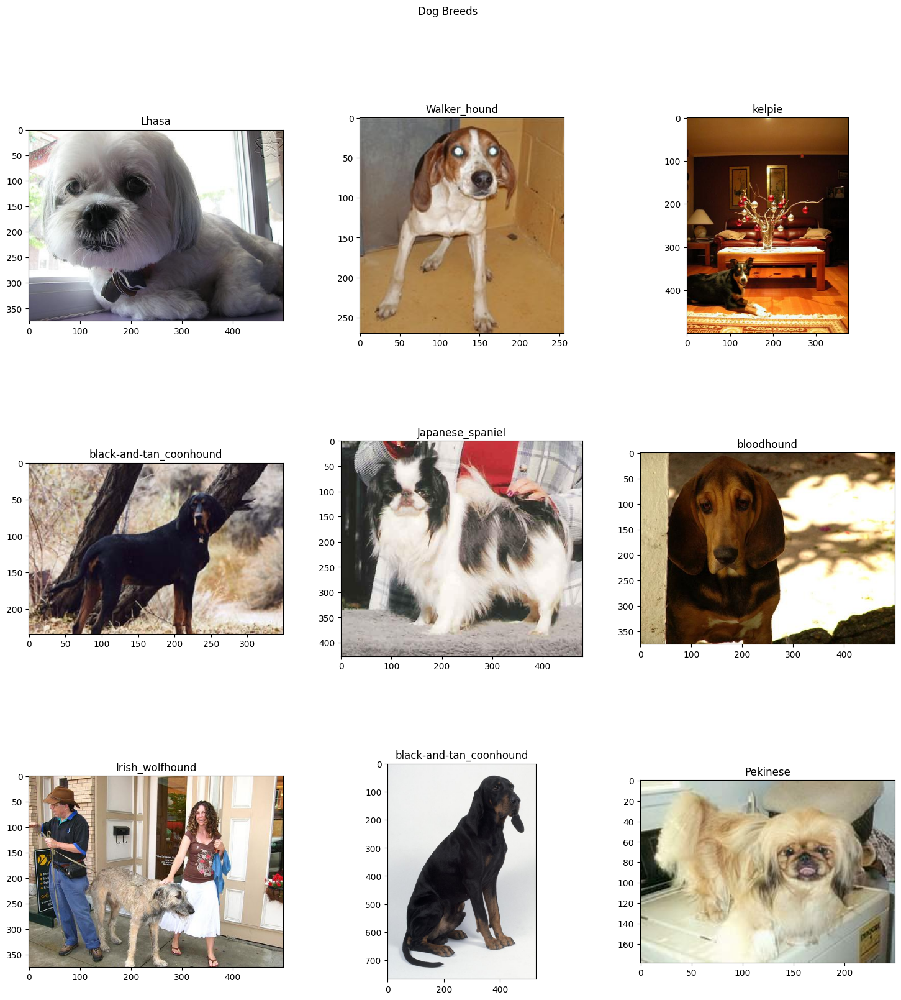

In [9]:
plt.figure(figsize=(18,18))
for counter, i in enumerate(random.sample(range(0,len(X)),9)):
    plt.subplot(3,3, counter+1)
    plt.subplots_adjust(hspace=0.5)
    fileName = X[i]
    image = imread(fileName)
    plt.imshow(image)
    plt.title(Y[i], fontsize=12)
plt.suptitle("Dog Breeds")
plt.show()

# 3. Tiền xử lý dữ liệu

Laptop có 12gb RAM. Để giải quyết vấn đề đó tiến hành lấy 1 tập nhỏ dữ liệu. Nhưng sẽ làm giảm hiệu suất của mô hình.


In [10]:
X = X[:2000]
Y = Y[:2000]

Mã hóa dữ liệu, mã hóa các giống cũng rất quan trọng.
Sử dụng one-hot encoding, sao cho mỗi hình ảnh sẽ có 120 cột, với tất cả trừ 1 cột có giá trị bằng 0.
Cột duy nhất có giá trị 1 là giống liên quan của hình ảnh.

In [11]:
from sklearn.preprocessing import LabelEncoder
from keras.src.utils import to_categorical

le = LabelEncoder()
le.fit(Y)
y_encoding = to_categorical(le.transform(Y), len(breeds))
print(y_encoding.shape) #1000images, 120labels

y_encoding = np.array(y_encoding)

(2000, 120)


Lưu danh sách tên loài vào file CSV để ứng dụng khi cần

In [12]:
breeds_df = pd.DataFrame({'Breed': le.classes_})
breeds_df.to_csv('breeds_list.csv', index=False)

print('Danh sách các tên loài đã được lưu vào breeds_list.csv')

Danh sách các tên loài đã được lưu vào breeds_list.csv


Chuẩn bị dữ liệu huấn luyện, xác thực và kiểm tra, chúng tôi tải hình ảnh lên cùng kích thước và chuyển đổi chúng thành một mảng hình ảnh,
mỗi mảng chứa các giá trị rgb của mọi pixel.
Lưu ý: Điều quan trọng là phải chuyển đổi hình ảnh thành một kích thước tương tự như kích thước mà mô hình được đào tạo trước được đào tạo.


In [13]:
from sklearn.model_selection import train_test_split
from keras.src.utils.image_utils import img_to_array, load_img

img_data = np.array([img_to_array(load_img(img, target_size = (299,299))) for img in X])
print(img_data.shape)
x_train, x_test, y_train, y_test = train_test_split(img_data, y_encoding, test_size = 0.2, random_state = 2)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2, random_state = 2)

print('Training Dataset Size:', x_train.shape)
print('Validation Dataset Size:', x_val.shape)
print('Testing Dataset Size: ', x_test.shape)
print('Training Label Size:', y_train.shape)
print('Validation Label Size: ', y_val.shape)
print('Testing Label Size: ', y_test.shape)

import gc
del img_data
gc.collect()

(2000, 299, 299, 3)
Training Dataset Size: (1280, 299, 299, 3)
Validation Dataset Size: (320, 299, 299, 3)
Testing Dataset Size:  (400, 299, 299, 3)
Training Label Size: (1280, 120)
Validation Label Size:  (320, 120)
Testing Label Size:  (400, 120)


0

Thực hiện tăng cường dữ liệu, đặc biệt là có một tập dữ liệu nhỏ và cung cấp dữ liệu đa dạng hơn đáng kể mà không cần thu thập chúng.
Điều này hoạt động bằng cách áp dụng một số phép biến đổi cho hình ảnh của chúng tôi (ví dụ: xoay, lật trục) để tạo ra các phiên bản 'mới' của hình ảnh hiện có,
do đó cung cấp cho chúng tôi nhiều dữ liệu hơn để đào tạo.

In [14]:
from keras.src.applications.inception_v3 import preprocess_input
from keras.src.legacy.preprocessing.image import ImageDataGenerator

batch_size = 64

train_datagen = ImageDataGenerator (
    preprocessing_function=preprocess_input,
    rotation_range = 30,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    horizontal_flip = True,
    # shear_range=0.2,
    # brightness_range=[0.8,1.2] 
)
                                    

train_generator = train_datagen.flow(x_train, y_train, shuffle = False, batch_size = batch_size, seed = 1)
val_datagen = ImageDataGenerator (preprocessing_function=preprocess_input) # do not augment validation data
val_generator = val_datagen.flow(x_val, y_val, shuffle = False, batch_size = batch_size, seed = 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


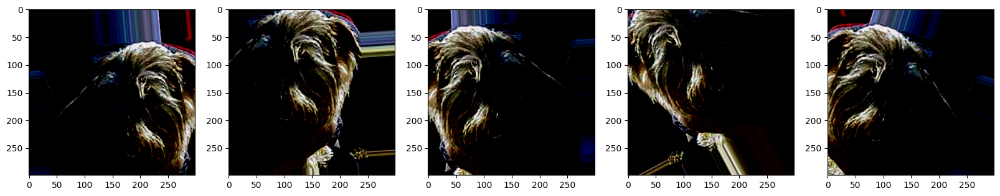

In [15]:
img_id = 2
dog_generator = train_datagen.flow(x_train[img_id:img_id+1], y_train[img_id:img_id+1], shuffle = False, batch_size = batch_size, seed = 1)
plt.figure(figsize=(20,20))
dogs = [next(dog_generator) for i in range(0,5)]
for counter, dog in enumerate(dogs):
    plt.subplot(1, 5, counter+1)
    plt.imshow(dog[0][0])
plt.show()

# 4. Mô hình mạng nơ ron, phương pháp học chuyển giao

Xây dựng mô hình. Sử dụng mô hình Inception V3 của Google.
Cũng có các mô hình khác có thể sử dụng trong Keras. Thực hiện xóa lớp cuối cùng của mô hình Inception V3 và đưa đầu ra của nó vào tập hợp các lớp của riêng tôi,
kết thúc bằng một lớp Dense cuối cùng để phân loại hoặc dự đoán hình ảnh thuộc về giống nào trong số 120 giống. Và đóng băng mô hình Inception V3 ban đầu vì nó đã
được đào tạo trước đó và biên dịch mô hình.

In [16]:
from keras import Input, models, layers
from keras.src.optimizers import Adam
from keras.src.applications.inception_v3 import InceptionV3
from keras.src.utils import plot_model

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

inputs = Input(shape=(299, 299, 3))
x = base_model(inputs)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(512, activation='relu')(x)
outputs = layers.Dense(len(breeds), activation='softmax')(x)
model = models.Model(inputs=inputs, outputs=outputs)

for layer in base_model.layers:
    layer.trainable = False
print('Số trọng số sau khi đóng băng:', len(model.trainable_weights))

Số trọng số sau khi đóng băng: 6


In [17]:
model.compile(optimizer=Adam(learning_rate=.0001), loss='categorical_crossentropy', metrics=['accuracy'])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 8, 8, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 120)            │        61,560 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,176,088 (88.41 MB)

 Trainable params: 1,373,304 (5.24 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

None


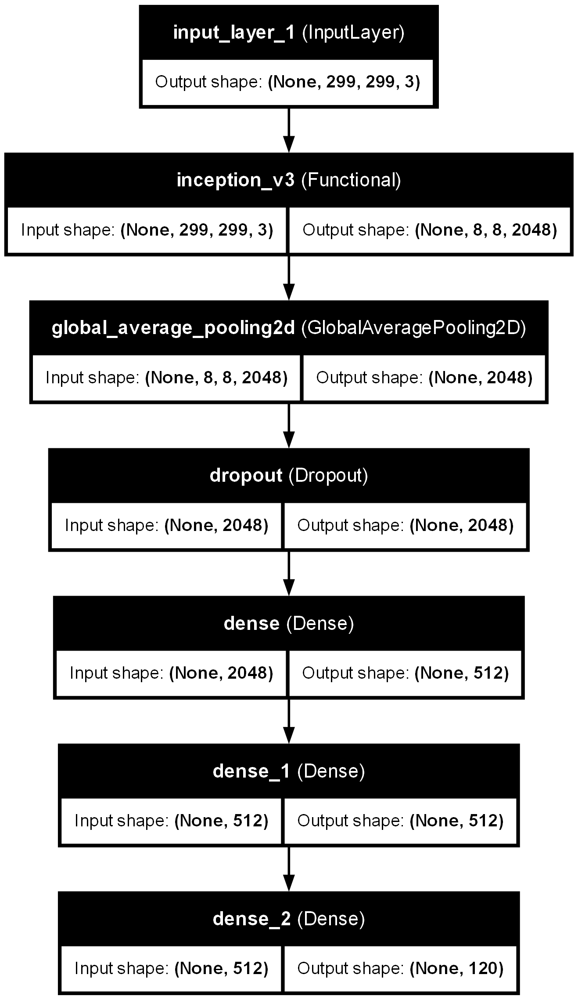

In [18]:
plot_model(model, to_file="model_structure.png", show_shapes=True, show_layer_names=True)

Mô hình đào tạo có batch size là số lượng hình ảnh được truyền đến mô hình để đào tạo trong mỗi lần lặp lại.
Do đó, số lần lặp lại/bước là số lượng hình ảnh chia cho batch size, tạo thành 1 epoch.
Sau mỗi lần lặp lại, trọng số của các nút sẽ được cập nhật. Một epoch kết thúc khi toàn bộ tập dữ liệu đã được truyền qua.
Càng có nhiều epoch, mô hình sẽ đào tạo dữ liệu càng nhiều.

In [19]:
from keras.src.callbacks import EarlyStopping, ReduceLROnPlateau
# earlystop = EarlyStopping(monitor='val_loss', min_delta=0, patience = 2, verbose=0, mode='auto')
earlystop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [20]:
epochs = 22
# Auto set: steps_per_epoch=20, validation_steps=5
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator,
    callbacks=[earlystop]
)

Epoch 1/22


c:\Users\lemin\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


20/20 ━━━━━━━━━━━━━━━━━━━━ 190s 8s/step - accuracy: 0.0152 - loss: 4.8086 - val_accuracy: 0.0844 - val_loss: 4.6249
Epoch 2/22
20/20 ━━━━━━━━━━━━━━━━━━━━ 156s 7s/step - accuracy: 0.0927 - loss: 4.5725 - val_accuracy: 0.2438 - val_loss: 4.4117
Epoch 3/22
20/20 ━━━━━━━━━━━━━━━━━━━━ 146s 7s/step - accuracy: 0.2161 - loss: 4.2929 - val_accuracy: 0.3500 - val_loss: 4.0967
Epoch 4/22
20/20 ━━━━━━━━━━━━━━━━━━━━ 153s 7s/step - accuracy: 0.3756 - loss: 3.8910 - val_accuracy: 0.4250 - val_loss: 3.6594
Epoch 5/22
20/20 ━━━━━━━━━━━━━━━━━━━━ 135s 6s/step - accuracy: 0.4895 - loss: 3.4372 - val_accuracy: 0.4969 - val_loss: 3.1272
Epoch 6/22
20/20 ━━━━━━━━━━━━━━━━━━━━ 132s 6s/step - accuracy: 0.5784 - loss: 2.8400 - val_accuracy: 0.5750 - val_loss: 2.5682
Epoch 7/22
20/20 ━━━━━━━━━━━━━━━━━━━━ 146s 7s/step - accuracy: 0.6472 - loss: 2.2744 - val_accuracy: 0.6531 - val_loss: 2.0828
Epoch 8/22
20/20 ━━━━━━━━━━━━━━━━━━━━ 134s 6s/step - accuracy: 0.7253 - loss: 1.7935 - val_accuracy: 0.6875 - val_loss: 1.

In [21]:
model.save('modelDogBreeds.h5')

Biểu đồ độ chính xác và tổn thất tôi đã lập biểu đồ về độ chính xác và tổn thất cho dữ liệu huấn luyện và xác nhận. Điều này cho chúng ta biết mô hình của chúng ta đang hoạt động như thế nào (ví dụ: underfitting, overfitting,...).

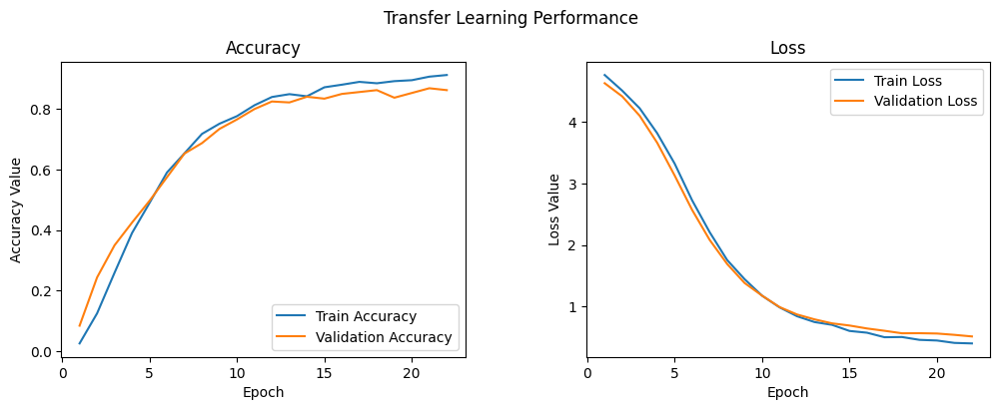

In [22]:
f, (ax1, ax2) = plt.subplots (1, 2, figsize=(12, 4))
t = f.suptitle('Transfer Learning Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, epochs+1))
ax1.plot(epoch_list, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks (np.arange(0, epochs+1, 5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks (np.arange(0, epochs+1, 5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch') 
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

Dự đoán trên tập kiểm tra

Sau đó, áp dụng mô hình của mình cho tập dữ liệu mà nó chưa từng thấy trước đây. Điều này rất quan trọng vì muốn một mô hình có thể khái quát hóa cho các tập dữ liệu khác ngoài những gì nó được đào tạo. Một mô hình chỉ hoạt động tốt trên tập dữ liệu huấn luyện và xác thực mà không hoạt động tốt trên tập dữ liệu thử nghiệm thì không phải là một mô hình không ổn.

In [23]:
x_test1 = x_test / 255. 
test_predictions = model.predict(x_test1)

predictions = le.classes_[np.argmax(test_predictions, axis=1)]
target_labels = le.classes_[np.argmax(y_test,axis=1)]

predict_df = pd.DataFrame({'Target_Labels': target_labels, 'Predictions': predictions}) 
predict_df.head(20)

13/13 ━━━━━━━━━━━━━━━━━━━━ 36s 3s/step


,Target_Labels,Predictions
0,golden_retriever,Saluki
1,Newfoundland,flat-coated_retriever
2,Staffordshire_bullterrier,Staffordshire_bullterrier
3,Kerry_blue_terrier,Kerry_blue_terrier
4,otterhound,otterhound
5,basenji,basenji
6,malamute,Eskimo_dog
7,Siberian_husky,Eskimo_dog
8,German_shepherd,German_shepherd
9,Japanese_spaniel,Japanese_spaniel


In [24]:
succ = (target_labels == predictions).sum()
fail = (target_labels != predictions).sum()
succ, fail

(338, 62)

Chỉ số đánh giá mô hình, tôi đo lường mức độ hoạt động của mô hình bằng cách tính toán độ chính xác của các dự đoán so với target_labels thực tế.

In [25]:
correct = (target_labels == predictions)
accuracy = correct.sum() / correct.size
print(accuracy)

0.845


In [26]:
from sklearn import metrics

def get_metrics(true_labels, predicted_labels):
    
    print('Accuracy:', np.round(
                        metrics.accuracy_score(true_labels, 
                                               predicted_labels),
                        4))
    print('Precision:', np.round(
                        metrics.precision_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
    print('Recall:', np.round(
                        metrics.recall_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
    print('F1 Score:', np.round(
                        metrics.f1_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
get_metrics (true_labels=target_labels, predicted_labels=predictions)

Accuracy: 0.845
Precision: 0.897
Recall: 0.845
F1 Score: 0.8482


c:\Users\lemin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Vẽ biểu đồ dự đoán dựa trên nhãn thực tế để hình dung rõ hơn hiệu suất dự đoán, phác thảo một loạt nhỏ tập dữ liệu thử nghiệm, cùng với nhãn thực tế, dự đoán cũng như các giá trị xác suất mà mô hình dự đoán chúng nằm trong danh mục.

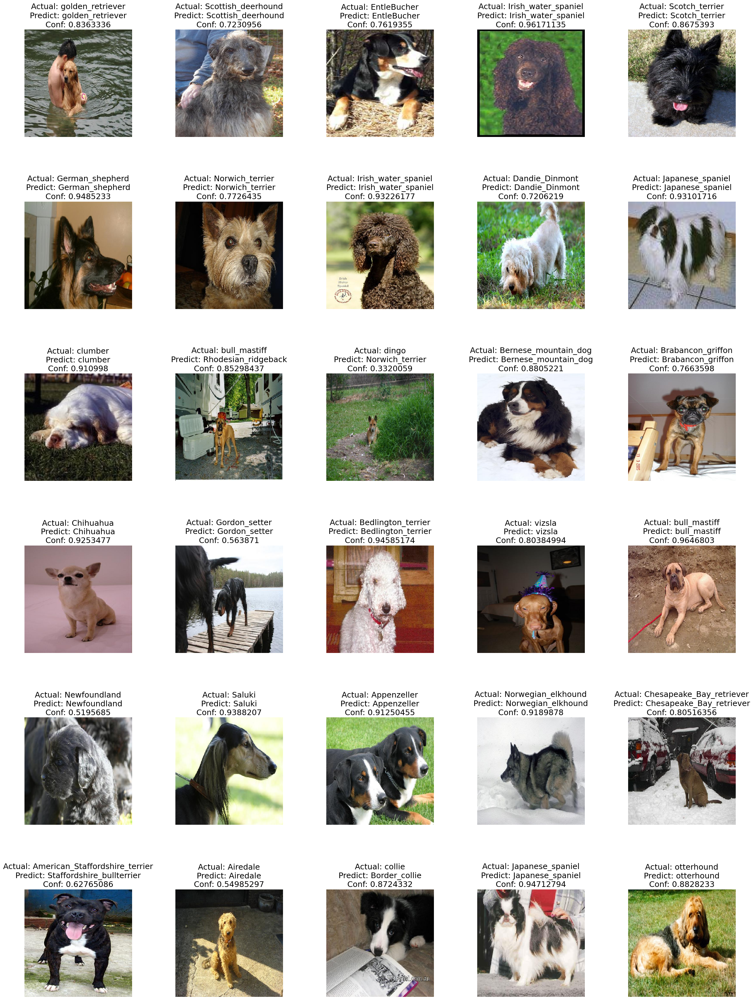

In [27]:
plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample (range(0, len(y_test)), 30)): # random 30 images 
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(x_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredict: ' + predicted + '\nConf: ' + conf, fontsize=18)
plt.show()